In [1]:
import numpy as np
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
import datetime
import plotly.express as px
import plotly.graph_objects as go

In [2]:
file_name = 'E:\PythonRes\Datasets\Proiecte actuale\Tema10 - Beijing PM2.5 Data\PRSA_data_2010.1.1-2014.12.31 - copy.csv'
df_Beijing = pd.read_csv ( file_name)

In [3]:
df_Beijing.head()

,No,year,month,day,hour,pm2.5,DEWP,TEMP,PRES,cbwd,NW,SE,NE,cv,Iws,Is,Ir
0,1,2010,1,1,0,NaN,-21,-11.0,1021.0,NW,1,0,0,0,1.79,0,0
1,2,2010,1,1,1,NaN,-21,-12.0,1020.0,NW,1,0,0,0,4.92,0,0
2,3,2010,1,1,2,NaN,-21,-11.0,1019.0,NW,1,0,0,0,6.71,0,0
3,4,2010,1,1,3,NaN,-21,-14.0,1019.0,NW,1,0,0,0,9.84,0,0
4,5,2010,1,1,4,NaN,-20,-12.0,1018.0,NW,1,0,0,0,12.97,0,0


In [4]:
df_Beijing.shape

(43824, 17)

In [5]:
print("tipuri date", df_Beijing.dtypes)

tipuri date No         int64
year       int64
month      int64
day        int64
hour       int64
pm2.5    float64
DEWP       int64
TEMP     float64
PRES     float64
cbwd      object
NW         int64
SE         int64
NE         int64
cv         int64
Iws      float64
Is         int64
Ir         int64
dtype: object


In [6]:
display(df_Beijing.describe())

,No,year,month,day,hour,pm2.5,DEWP,TEMP,PRES,NW,SE,NE,cv,Iws,Is,Ir
count,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,41757.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000
mean,21912.500000,2012.000000,6.523549,15.727820,11.500000,98.613215,1.817246,12.448521,1016.447654,0.322814,0.348896,0.000228,0.214198,23.889140,0.052734,0.194916
std,12651.043435,1.413842,3.448572,8.799425,6.922266,92.050387,14.433440,12.198613,10.268698,0.467558,0.476626,0.015104,0.410269,50.010635,0.760375,1.415867
min,1.000000,2010.000000,1.000000,1.000000,0.000000,0.000000,-40.000000,-19.000000,991.000000,0.000000,0.000000,0.000000,0.000000,0.450000,0.000000,0.000000
25%,10956.750000,2011.000000,4.000000,8.000000,5.750000,29.000000,-10.000000,2.000000,1008.000000,0.000000,0.000000,0.000000,0.000000,1.790000,0.000000,0.000000
50%,21912.500000,2012.000000,7.000000,16.000000,11.500000,72.000000,2.000000,14.000000,1016.000000,0.000000,0.000000,0.000000,0.000000,5.370000,0.000000,0.000000
75%,32868.250000,2013.000000,10.000000,23.000000,17.250000,137.000000,15.000000,23.000000,1025.000000,1.000000,1.000000,0.000000,0.000000,21.910000,0.000000,0.000000
max,43824.000000,2014.000000,12.000000,31.000000,23.000000,994.000000,28.000000,42.000000,1046.000000,1.000000,1.000000,1.000000,1.000000,585.600000,27.000000,36.000000


In [7]:
print("raport valori lipsa/ valori bune")

results = []
for c in df_Beijing.columns:
    # filtram cu conditia ca valorile din coloana c sa fie lipsa si returnam numarul de linii
    missing_cnt = df_Beijing[ df_Beijing[c].isna() ].shape[0]  #Intre [] se specifica conditia!!!
    dict_row ={"nume coloana": c,
                "valori lipsa": str(missing_cnt),
               "procent valori bune": round( 100*(1-missing_cnt/df_Beijing.shape[0]),2)}
    results.append(dict_row)

display(pd.DataFrame(results))

raport valori lipsa/ valori bune


,nume coloana,valori lipsa,procent valori bune
0,No,0,100.00
1,year,0,100.00
2,month,0,100.00
3,day,0,100.00
4,hour,0,100.00
5,pm2.5,2067,95.28
6,DEWP,0,100.00
7,TEMP,0,100.00
8,PRES,0,100.00
9,cbwd,0,100.00


In [8]:
df_B1 = df_Beijing.dropna(subset = ["pm2.5"], inplace = False)

In [9]:
# df_B1 = df_B1[24:].fillna(method="ffill")
# print(df_B1['pm2.5'].isna().sum())

df_B1 = df_B1.dropna(subset = ["pm2.5"], inplace = False)

In [10]:
df_B1.drop(['No'], axis=1)
print(f"exista {df_B1['pm2.5'].isna().sum()} valori nule")
df_B1.describe()

exista 0 valori nule


,No,year,month,day,hour,pm2.5,DEWP,TEMP,PRES,NW,SE,NE,cv,Iws,Is,Ir
count,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000
mean,22279.380104,2012.042771,6.513758,15.685514,11.502311,98.613215,1.750174,12.401561,1016.442896,0.323036,0.348995,0.000216,0.214192,23.866747,0.055344,0.194866
std,12658.168415,1.415311,3.454199,8.785539,6.924848,92.050387,14.433658,12.175215,10.300733,0.467642,0.476658,0.014680,0.410265,49.617495,0.778875,1.418165
min,25.000000,2010.000000,1.000000,1.000000,0.000000,0.000000,-40.000000,-19.000000,991.000000,0.000000,0.000000,0.000000,0.000000,0.450000,0.000000,0.000000
25%,11464.000000,2011.000000,4.000000,8.000000,5.000000,29.000000,-10.000000,2.000000,1008.000000,0.000000,0.000000,0.000000,0.000000,1.790000,0.000000,0.000000
50%,22435.000000,2012.000000,7.000000,16.000000,12.000000,72.000000,2.000000,14.000000,1016.000000,0.000000,0.000000,0.000000,0.000000,5.370000,0.000000,0.000000
75%,33262.000000,2013.000000,10.000000,23.000000,18.000000,137.000000,15.000000,23.000000,1025.000000,1.000000,1.000000,0.000000,0.000000,21.910000,0.000000,0.000000
max,43824.000000,2014.000000,12.000000,31.000000,23.000000,994.000000,28.000000,42.000000,1046.000000,1.000000,1.000000,1.000000,1.000000,565.490000,27.000000,36.000000


In [11]:
df_B1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41757 entries, 24 to 43823
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   No      41757 non-null  int64  
 1   year    41757 non-null  int64  
 2   month   41757 non-null  int64  
 3   day     41757 non-null  int64  
 4   hour    41757 non-null  int64  
 5   pm2.5   41757 non-null  float64
 6   DEWP    41757 non-null  int64  
 7   TEMP    41757 non-null  float64
 8   PRES    41757 non-null  float64
 9   cbwd    41757 non-null  object 
 10  NW      41757 non-null  int64  
 11  SE      41757 non-null  int64  
 12  NE      41757 non-null  int64  
 13  cv      41757 non-null  int64  
 14  Iws     41757 non-null  float64
 15  Is      41757 non-null  int64  
 16  Ir      41757 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 5.7+ MB


In [12]:
frecventa_abs = df_B1.groupby('cbwd').count()

In [13]:
frecventa_cumulata = frecventa_abs['year'].cumsum()

In [14]:
print(frecventa_cumulata)

cbwd
NE     4756
NW    18240
SE    32813
cv    41757
Name: year, dtype: int64


In [15]:
from sklearn.decomposition import PCA
from sklearn import preprocessing
import matplotlib.pyplot as plt

In [16]:
df_B1.drop(['cbwd'],axis=1, inplace=True)

In [17]:
df_B1.insert(loc = 0, column = 'time', value = pd.to_datetime(df_B1[['year', 'month', 'day', 'hour']]))
df_B1.head()

,time,No,year,month,day,hour,pm2.5,DEWP,TEMP,PRES,NW,SE,NE,cv,Iws,Is,Ir
24,2010-01-02 00:00:00,25,2010,1,2,0,129.0,-16,-4.0,1020.0,0,1,0,0,1.79,0,0
25,2010-01-02 01:00:00,26,2010,1,2,1,148.0,-15,-4.0,1020.0,0,1,0,0,2.68,0,0
26,2010-01-02 02:00:00,27,2010,1,2,2,159.0,-11,-5.0,1021.0,0,1,0,0,3.57,0,0
27,2010-01-02 03:00:00,28,2010,1,2,3,181.0,-7,-5.0,1022.0,0,1,0,0,5.36,1,0
28,2010-01-02 04:00:00,29,2010,1,2,4,138.0,-7,-5.0,1022.0,0,1,0,0,6.25,2,0


In [18]:
df_B1.drop(['No','year','month','day','hour'], axis=1, inplace=True)

In [19]:
df_B1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41757 entries, 24 to 43823
Data columns (total 12 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   time    41757 non-null  datetime64[ns]
 1   pm2.5   41757 non-null  float64       
 2   DEWP    41757 non-null  int64         
 3   TEMP    41757 non-null  float64       
 4   PRES    41757 non-null  float64       
 5   NW      41757 non-null  int64         
 6   SE      41757 non-null  int64         
 7   NE      41757 non-null  int64         
 8   cv      41757 non-null  int64         
 9   Iws     41757 non-null  float64       
 10  Is      41757 non-null  int64         
 11  Ir      41757 non-null  int64         
dtypes: datetime64[ns](1), float64(4), int64(7)
memory usage: 4.1 MB


In [20]:
print("raport valori lipsa/ valori bune")

results = []
for c in df_B1.columns:
    # filtram cu conditia ca valorile din coloana c sa fie lipsa si returnam numarul de linii
    missing_cnt = df_B1[ df_B1[c].isna() ].shape[0]  #Intre [] se specifica conditia!!!
    dict_row ={"nume coloana": c,
                "valori lipsa": str(missing_cnt),
               "procent valori bune": round( 100*(1-missing_cnt/df_B1.shape[0]),2)}
    results.append(dict_row)

display(pd.DataFrame(results))

raport valori lipsa/ valori bune


,nume coloana,valori lipsa,procent valori bune
0,time,0,100.0
1,pm2.5,0,100.0
2,DEWP,0,100.0
3,TEMP,0,100.0
4,PRES,0,100.0
5,NW,0,100.0
6,SE,0,100.0
7,NE,0,100.0
8,cv,0,100.0
9,Iws,0,100.0


In [21]:
print("tipuri date", df_B1.dtypes)

tipuri date time     datetime64[ns]
pm2.5           float64
DEWP              int64
TEMP            float64
PRES            float64
NW                int64
SE                int64
NE                int64
cv                int64
Iws             float64
Is                int64
Ir                int64
dtype: object


In [22]:
#pd.to_datetime(df_B1[['year', 'month', 'day', 'hour']])

<AxesSubplot:>

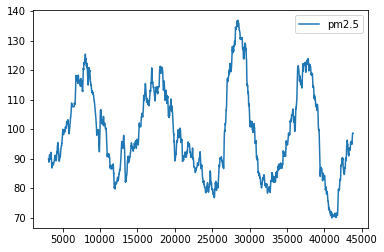

In [23]:
df_mean = df_B1.rolling(window = 3000).mean()
df_mean[['pm2.5']].plot()

In [24]:
df_B1_copy = df_B1.copy()

In [25]:
df_B1_copy = df_B1_copy.drop(['time'], axis=1)

In [26]:
df_B1_copy.describe()

,pm2.5,DEWP,TEMP,PRES,NW,SE,NE,cv,Iws,Is,Ir
count,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000,41757.000000
mean,98.613215,1.750174,12.401561,1016.442896,0.323036,0.348995,0.000216,0.214192,23.866747,0.055344,0.194866
std,92.050387,14.433658,12.175215,10.300733,0.467642,0.476658,0.014680,0.410265,49.617495,0.778875,1.418165
min,0.000000,-40.000000,-19.000000,991.000000,0.000000,0.000000,0.000000,0.000000,0.450000,0.000000,0.000000
25%,29.000000,-10.000000,2.000000,1008.000000,0.000000,0.000000,0.000000,0.000000,1.790000,0.000000,0.000000
50%,72.000000,2.000000,14.000000,1016.000000,0.000000,0.000000,0.000000,0.000000,5.370000,0.000000,0.000000
75%,137.000000,15.000000,23.000000,1025.000000,1.000000,1.000000,0.000000,0.000000,21.910000,0.000000,0.000000
max,994.000000,28.000000,42.000000,1046.000000,1.000000,1.000000,1.000000,1.000000,565.490000,27.000000,36.000000


## Matricea de corelatie

In [27]:
coloane=['time','pm2.5','DEWP','TEMP','PRES','NW','SE','NE','cv','Iws','Is','Ir']
df_B1[coloane].corr(method = 'pearson')

,pm2.5,DEWP,TEMP,PRES,NW,SE,NE,cv,Iws,Is,Ir
pm2.5,1.000000,0.171423,-0.090534,-0.047282,-0.245044,0.097108,-0.010944,0.156195,-0.247784,0.019266,-0.051369
DEWP,0.171423,1.000000,0.823821,-0.777722,-0.343063,0.276411,-0.027890,0.090937,-0.293106,-0.034925,0.125341
TEMP,-0.090534,0.823821,1.000000,-0.826903,-0.254617,0.308562,-0.032241,-0.003479,-0.149613,-0.094785,0.049544
PRES,-0.047282,-0.777722,-0.826903,1.000000,0.233236,-0.248891,0.025501,-0.022060,0.178871,0.070537,-0.080532
NW,-0.245044,-0.343063,-0.254617,0.233236,1.000000,-0.465811,-0.006654,-0.183148,0.357320,-0.024560,0.031253
SE,0.097108,0.276411,0.308562,-0.248891,-0.465811,1.000000,-0.010750,-0.382262,-0.079416,0.040928,-0.039246
NE,-0.010944,-0.027890,-0.032241,0.025501,-0.006654,-0.010750,1.000000,-0.007666,-0.000006,-0.001043,-0.002018
cv,0.156195,0.090937,-0.003479,-0.022060,-0.183148,-0.382262,-0.007666,1.000000,-0.228275,-0.014914,-0.021028
Iws,-0.247784,-0.293106,-0.149613,0.178871,0.357320,-0.079416,-0.000006,-0.228275,1.000000,0.022630,-0.009157
Is,0.019266,-0.034925,-0.094785,0.070537,-0.024560,0.040928,-0.001043,-0.014914,0.022630,1.000000,-0.009764


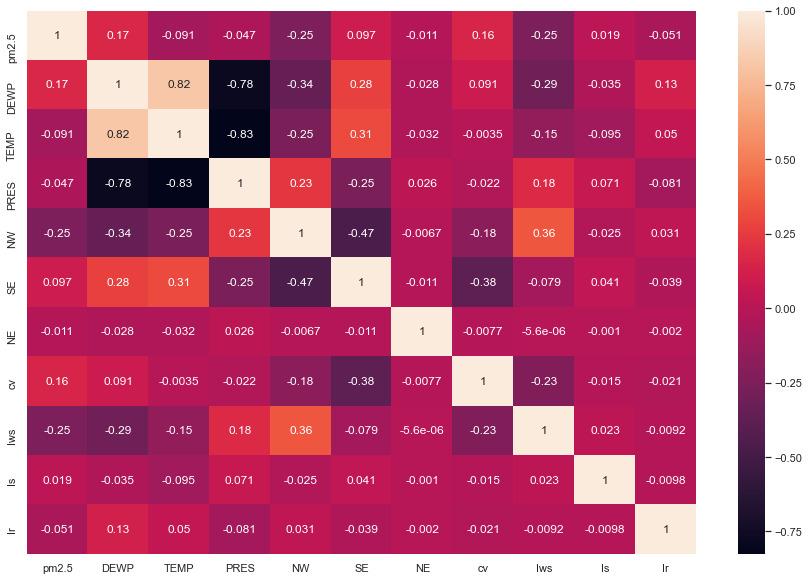

In [28]:
corrMatrix = df_B1_copy.corr()
sns.set(rc={'figure.figsize':(15,10)})
sns.heatmap(corrMatrix, annot=True)
plt.show()

In [29]:
df_test1 = df_B1[['pm2.5','TEMP']]
df_test1

,pm2.5,TEMP
24,129.0,-4.0
25,148.0,-4.0
26,159.0,-5.0
27,181.0,-5.0
28,138.0,-5.0
...,...,...
43819,8.0,-2.0
43820,10.0,-3.0
43821,10.0,-3.0
43822,8.0,-4.0


In [41]:
df_B1.to_excel("E:\PythonRes\Datasets\Proiecte actuale\Tema10 - Beijing PM2.5 Data\Beijing_Pollution.xlsx",

             sheet_name='Sheet1')  

In [30]:
from scipy.stats import spearmanr
spearmanr(df_test1.TEMP,df_test1['pm2.5'])  

SpearmanrResult(correlation=0.010783648336008554, pvalue=0.027553479079195028)

In [31]:
# înțelegerea puterei relației dintre două variabile
df_test1 = df_B1[['pm2.5','TEMP']].drop_duplicates()
c1 = "pm2.5"
c2 = 'TEMP'
df_test1 = df_test1.sort_values(by = [c1]).reset_index()
df_test1["Rang "+c1] = df_test1.index+1
df_test1 = df_test1.sort_values(by = [c2]).reset_index()
df_test1["Rang "+c2] = df_test1.index+1
df_test1["RangDiff^2"] = (df_test1["Rang "+c1]-df_test1["Rang "+c2])**2
print("Spearmn's rho:")
n = df_test1.shape[0]
1- df_test1["RangDiff^2"].sum()*6/(n*(n**2-1))

Spearmn's rho:


-0.12873693727230995

In [32]:
df_test2 = df_B1[['TEMP','PRES']]
df_test2

,TEMP,PRES
24,-4.0,1020.0
25,-4.0,1020.0
26,-5.0,1021.0
27,-5.0,1022.0
28,-5.0,1022.0
...,...,...
43819,-2.0,1034.0
43820,-3.0,1034.0
43821,-3.0,1034.0
43822,-4.0,1034.0


In [33]:
from scipy.stats import spearmanr
spearmanr(df_test2.TEMP,df_test2['PRES'])

SpearmanrResult(correlation=-0.8323043435035902, pvalue=0.0)

In [34]:
df_test2 = df_B1[['TEMP','PRES']].drop_duplicates()
c1 = "TEMP"
c2 = 'PRES'
df_test2 = df_test2.sort_values(by = [c1]).reset_index()
df_test2["Rang "+c1] = df_test2.index+1
df_test2 = df_test2.sort_values(by = [c2]).reset_index()
df_test2["Rang "+c2] = df_test2.index+1
df_test2["RangDiff^2"] = (df_test2["Rang "+c1]-df_test2["Rang "+c2])**2
print("Spearmn's rho:")
n = df_test2.shape[0]
1- df_test2["RangDiff^2"].sum()*6/(n*(n**2-1))

Spearmn's rho:


-0.6661456286535421

In [35]:
df_test3 = df_B1[['DEWP','SE']]
df_test3

,DEWP,SE
24,-16,1
25,-15,1
26,-11,1
27,-7,1
28,-7,1
...,...,...
43819,-23,0
43820,-22,0
43821,-22,0
43822,-22,0


In [36]:
from scipy.stats import spearmanr
spearmanr(df_test3.DEWP,df_test3['SE'])

SpearmanrResult(correlation=0.2760604145156442, pvalue=0.0)

In [37]:
df_test3 = df_B1[['DEWP','SE']].drop_duplicates()
c1 = "DEWP"
c2 = 'SE'
df_test3 = df_test3.sort_values(by = [c1]).reset_index()
df_test3["Rang "+c1] = df_test3.index+1
df_test3 = df_test3.sort_values(by = [c2]).reset_index()
df_test3["Rang "+c2] = df_test3.index+1
df_test3["RangDiff^2"] = (df_test3["Rang "+c1]-df_test3["Rang "+c2])**2
print("Spearmn's rho:")
n = df_test3.shape[0]
1- df_test3["RangDiff^2"].sum()*6/(n*(n**2-1))

Spearmn's rho:


-0.073887566379784

In [38]:
np.cov(df_B1.DEWP,df_B1['pm2.5'])

array([[ 208.33048691,  227.7570422 ],
       [ 227.7570422 , 8473.27378169]])

In [39]:
fig = px.line(df_B1,x='time', y='pm2.5', title="Cantitate de particule poluante mai mici de 2,5 microni (perioada 2/1/2010-2/2/2010)", 
              range_x=['2010-01-02 00:00:00','2010-02-02 00:00:00'])
fig.show()

In [40]:
fig = px.line(df_B1,x='time', y='pm2.5', title="Cantitate de particule poluante mai mici de 2,5 microni", 
              range_x=['2014-01-02 00:00:00','2014-02-02 00:00:00'])
fig.show()

# Sortare date in functie de pm2.5

In [41]:
df_B1_copy.sort_values(by =['pm2.5'])

,pm2.5,DEWP,TEMP,PRES,NW,SE,NE,cv,Iws,Is,Ir
24034,0.0,-5,20.0,1020.0,1,0,0,0,139.48,0,0
24039,0.0,-10,24.0,1017.0,1,0,0,0,192.68,0,0
24075,1.0,6,9.0,1018.0,0,0,0,0,3.13,0,0
6315,1.0,13,14.0,1015.0,0,0,0,0,48.73,0,9
21402,1.0,-2,29.0,999.0,1,0,0,0,24.15,0,0
...,...,...,...,...,...,...,...,...,...,...,...
26590,858.0,-10,-9.0,1024.0,0,0,0,1,0.89,0,0
26588,886.0,-8,-7.0,1023.0,0,0,0,1,1.34,0,0
18050,972.0,-24,-12.0,1032.0,1,0,0,0,8.05,0,0
1057,980.0,-14,-7.0,1029.0,0,0,0,1,0.89,0,0


In [42]:
fig = px.box(df_B1_copy, y="pm2.5")
fig.show()

In [43]:
jumatate_nr_elem = len(df_B1[(df_B1['pm2.5']>=29) & (df_B1['pm2.5']<=137)])
outliers = len(df_B1[(df_B1['pm2.5']>=299)])
print(f'50% dintre valorile prezente in coloana pm2.5 ({jumatate_nr_elem}) se afla intre q1=29 si q3=137\nNr elementelor de tip outlier este ({outliers})')

50% dintre valorile prezente in coloana pm2.5 (21075) se afla intre q1=29 si q3=137
Nr elementelor de tip outlier este (1797)


In [44]:
valori_sigure = len(df_B1[(df_B1['pm2.5']>=0) & (df_B1['pm2.5']<=12)])
valori_moderate = len(df_B1[(df_B1['pm2.5']>=12.1) & (df_B1['pm2.5']<=35.4)])
valori_periculoase = len(df_B1[(df_B1['pm2.5']>=35.5) & (df_B1['pm2.5']<=55.4)])
valori_foarte_periculoase = len(df_B1[(df_B1['pm2.5']>=55.5) & (df_B1['pm2.5']<=150.4)])
valori_extreme = len(df_B1[(df_B1['pm2.5']>=150.5) & (df_B1['pm2.5']<=1000)])


print(f"valori sigure: {valori_sigure} ({round(valori_sigure/len(df_B1)*100,2)}% din total)")
print(f"valori_moderate: {valori_moderate} ({round(valori_moderate/len(df_B1)*100,2)}% din total)")
print(f"valori_periculoase: {valori_periculoase} ({round(valori_periculoase/len(df_B1)*100,2)}% din total)")
print(f"valori_foarte_periculoase: {valori_foarte_periculoase} ({round(valori_foarte_periculoase/len(df_B1)*100,2)}% din total)")
print(f"valori_extreme: {valori_extreme} ({round(valori_extreme/len(df_B1)*100,2)}% din total)")

raport = (valori_periculoase+valori_foarte_periculoase+valori_extreme)/len(df_B1)*100

print(f"Un procent de {round(raport,2)}% sunt valori care se afla peste intervalul recomandat de siguranta")

valori sigure: 3387 (8.11% din total)
valori_moderate: 8733 (20.91% din total)
valori_periculoase: 5003 (11.98% din total)
valori_foarte_periculoase: 15643 (37.46% din total)
valori_extreme: 8991 (21.53% din total)
Un procent de 70.97% sunt valori care se afla peste intervalul recomandat de siguranta


# Histograma 

In [45]:
fig = px.histogram(df_B1, x="pm2.5")
fig.show()

# Inregistrari totale pentru fiecare luna din perioada 2010-2014

In [46]:
fig = px.histogram(df_Beijing, x="month")
fig.update_layout(bargap=0.5)
fig.show()

<AxesSubplot:>

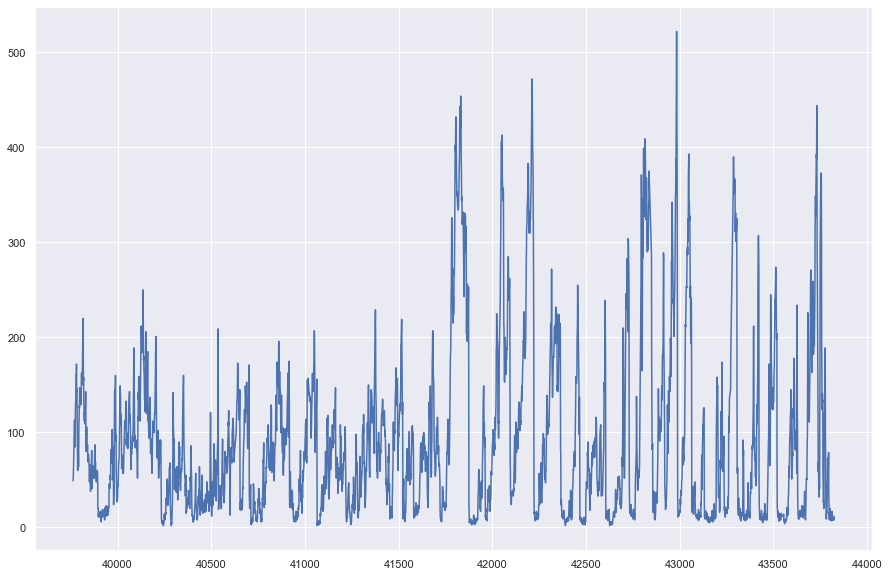

In [47]:
df_B1['pm2.5'][-4000:].plot()

E:\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:ylabel='Density'>

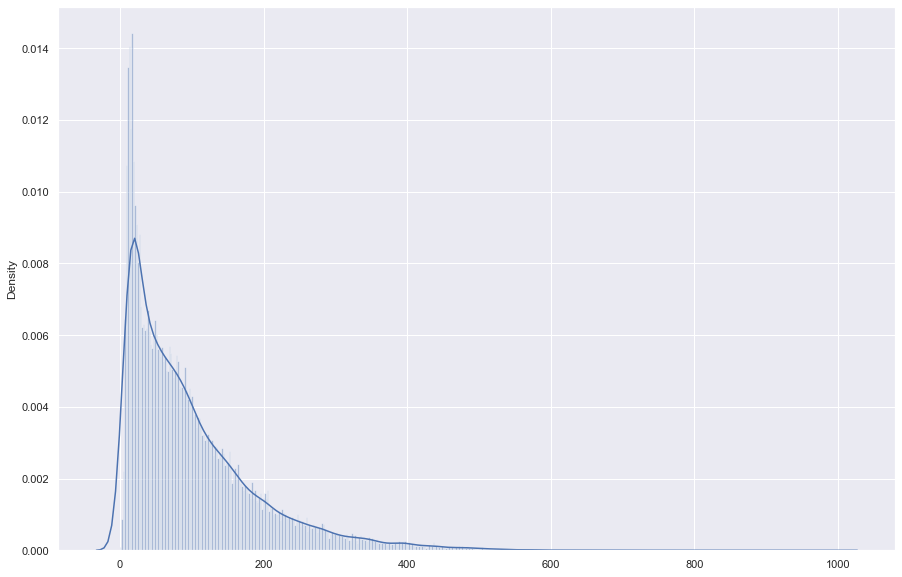

In [48]:
sns.distplot(df_B1[['pm2.5']], bins=500, kde=True, rug=False)

E:\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:>

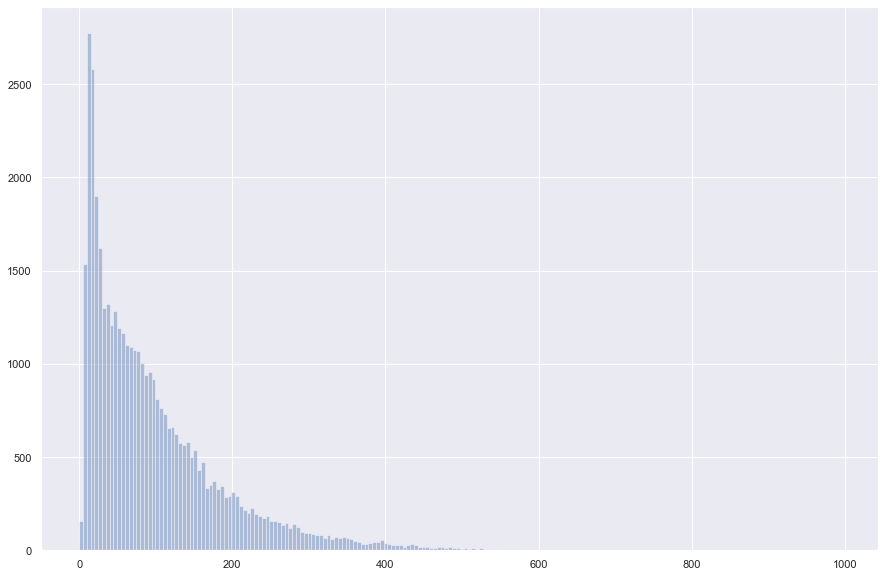

In [49]:
sns.distplot(df_B1[['pm2.5']], bins=200, kde=False, rug=False)

# COVARIANTA

In [50]:
np.cov(df_B1.Ir, df_B1.DEWP)  #merg doar 2 argumente 

array([[  2.0111931 ,   2.56563936],
       [  2.56563936, 208.33048691]])

<AxesSubplot:xlabel='an', ylabel='pm2.5'>

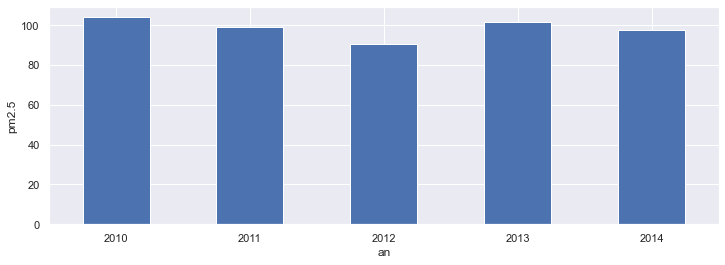

In [51]:
#media pe ani a pm2.5
fig, axs = plt.subplots(figsize=(12, 4))

df=df_B1.groupby(
    [df_B1["time"].dt.year])["pm2.5"].mean().plot(
    kind='bar', rot=0, ax=axs)
plt.xlabel("an");  

plt.ylabel("pm2.5");
df

<AxesSubplot:xlabel='luna si an', ylabel='pm2.5'>

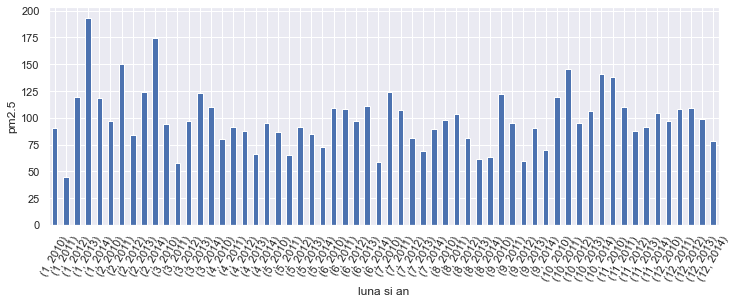

In [52]:
#pe luna si ani

fig, axs = plt.subplots(figsize=(12, 4))

df=df_B1.groupby(
    [df_B1["time"].dt.month,df_B1["time"].dt.year])["pm2.5"].mean().plot(
    kind='bar', rot=0, ax=axs)
plt.xlabel("luna si an");  
plt.xticks(rotation=60)
plt.ylabel("pm2.5");
df

<AxesSubplot:xlabel='luna si an', ylabel='pm2.5'>

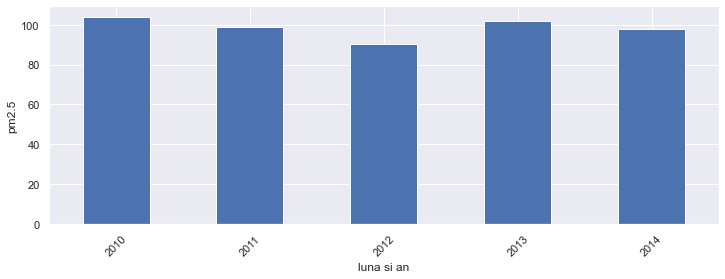

In [53]:
#pe luna si ani (prima luna din fiecare an)

fig, axs = plt.subplots(figsize=(12, 4))
df=df_B1.where(df_B1["time"].dt.month==1)
df=df_B1.groupby(
    [df_B1["time"].dt.year])["pm2.5"].mean().plot(
    kind='bar', rot=0, ax=axs)
plt.xlabel("luna si an");  
plt.xticks(rotation=45)
plt.ylabel("pm2.5");
df

<AxesSubplot:xlabel='luna si an', ylabel='pm2.5'>

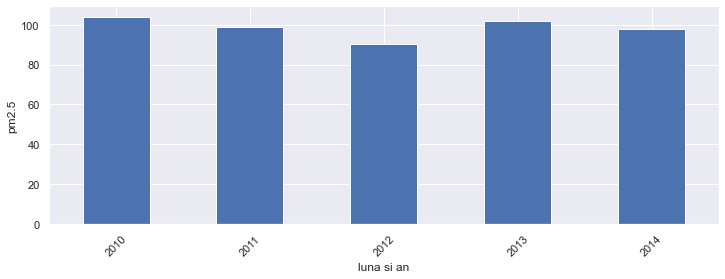

In [54]:
fig, axs = plt.subplots(figsize=(12, 4))
df=df_B1.where(df_B1["time"].dt.month==12)
df=df_B1.groupby(
    [df_B1["time"].dt.year])["pm2.5"].mean().plot(
    kind='bar', rot=0, ax=axs)
plt.xlabel("luna si an");  
plt.xticks(rotation=45)
plt.ylabel("pm2.5");
df

In [55]:
#poluare medie in functie de an
df_sample = df_B1.groupby(df_B1["time"].dt.year)['pm2.5'].agg('mean').reset_index()
df_sample.head(5)

,time,pm2.5
0,2010,104.045730
1,2011,99.071340
2,2012,90.545871
3,2013,101.712376
4,2014,97.734557


In [56]:
# create a line chart, years on x-axis, gdp on y-axis

fig = px.line(df_sample, x = df_sample.time, y = df_sample['pm2.5'], title='Evolutia poluarii in functie de an')
fig.show()

In [57]:
df_sample_pm_max = df_B1.groupby(df_B1["time"].dt.month)['pm2.5'].agg('max').reset_index()
df_sample_pm_mean = df_B1.groupby(df_B1["time"].dt.month)['pm2.5'].agg('mean').reset_index()

In [58]:
# create a line chart, month on x-axis, gdp on y-axis
fig = px.line(df_sample_pm_mean, x = df_sample_pm_mean.time, y = df_sample_pm_mean['pm2.5'], title='Valoarea medie a pm2.5 in functie de luna din an')
fig.show()

In [59]:
df_sample_temp = df_B1.groupby(df_B1.TEMP.round(0))['pm2.5'].agg('mean').reset_index()
df_sample_temp.head(10)

,TEMP,pm2.5
0,-19.0,27.500000
1,-18.0,46.800000
2,-17.0,99.428571
3,-16.0,105.136364
4,-15.0,92.911765
5,-14.0,83.700000
6,-13.0,73.402062
7,-12.0,80.481013
8,-11.0,76.389344
9,-10.0,82.800725


In [60]:
fig = px.line(df_sample_temp, x = df_sample_temp.TEMP, y = df_sample_temp['pm2.5'], title='Evolutia poluarii in functie de temperatura')
fig.show()

In [61]:
df_sample_wnd = df_Beijing.groupby('cbwd')['TEMP'].agg(['mean','min','max']).reset_index()
df_sample_wnd

,cbwd,mean,min,max
0,NE,10.278567,-18.0,39.0
1,NW,7.673781,-19.0,42.0
2,SE,17.644474,-15.0,41.0
3,cv,12.337701,-18.0,41.0


In [62]:
# Temperatura medie in functie de directia vantului, cat si procentul directiei din care bate vantul
fig = go.Figure(data=[go.Pie(labels=df_sample_wnd['cbwd'], values=df_sample_wnd['mean'], pull=[0.1, 0.2, 0,0,0])])
fig.show()

In [63]:
df_sample = df_B1.groupby(df_B1["time"].dt.month)['pm2.5'].agg('mean').reset_index()
df_sample.head(12)

,time,pm2.5
0,1,115.059061
1,2,125.736140
2,3,97.757593
3,4,83.709251
4,5,80.113051
5,6,96.513656
6,7,94.332328
7,8,79.996704
8,9,85.209421
9,10,120.401509


<AxesSubplot:xlabel='time', ylabel='pm2.5'>

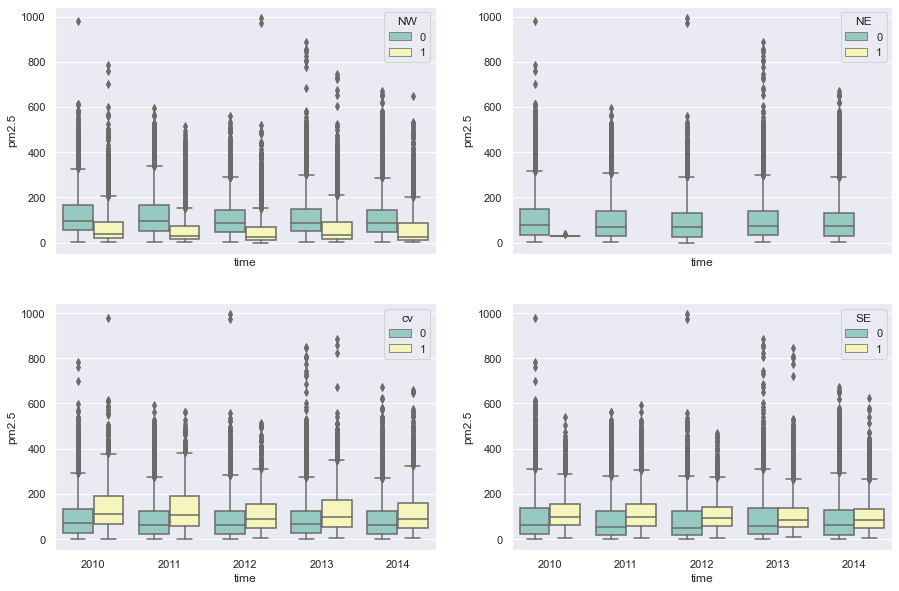

In [64]:
#POLUAREA IN FCT. DACA BATE SAU NU VATUL DIN FIECARE DIRECTIE LUATA PE RAND
f, axes = plt.subplots(2, 2, figsize=(15, 10), sharex=True)
sns.boxplot(x=df_B1["time"].dt.year, y="pm2.5", hue='NW', data=df_B1, palette="Set3",ax=axes[0, 0])
sns.boxplot(x=df_B1["time"].dt.year, y="pm2.5", hue='NE', data=df_B1, palette="Set3",ax=axes[0, 1])
sns.boxplot(x=df_B1["time"].dt.year, y="pm2.5", hue='cv', data=df_B1, palette="Set3",ax=axes[1, 0])
sns.boxplot(x=df_B1["time"].dt.year, y="pm2.5", hue='SE', data=df_B1, palette="Set3",ax=axes[1, 1])

In [65]:
#ax = sns.barplot( x=df_B1["SE"] , y = df_B1["time"].dt.year, hue = df_B1["pm2.5"], data = df_B1)

In [66]:
#ax = sns.barplot( x=df_B1["time"].dt.year , y = df_B1["TEMP"], hue ='NW', data = df_B1)

# MACHINE LEARNING (REGRESIE LINIARA)

In [122]:
import numpy as np
import sklearn
from sklearn.model_selection import train_test_split

In [159]:
#activam random_state pentru o alegere aleatorie dar persistenta (pentru a putea reproduce ulterior. In practica,
# atunci cand vom teste de mai mult ori, vom renunta la random_state)


##______________________________________________

## PENTRU TEME: alegeti ca si random_state numarul de ordine din catalog

##________________________________________________

traindf, testdf = train_test_split(df_B1, test_size=0.2, random_state=2)
#random_state => starea aleatorie e doar prima data, apoi foloseste mereu acelasi set de date ca sa poata fi
#reprodus experimentul 

# testing set ~ 20% din total data; training ~ 80%
print("Shape of full dataset is: {0}".format(df_B1.shape))
print("Shape of training dataset is: {0}".format(traindf.shape))
print("Shape of test dataset is: {0}".format(testdf.shape))

Shape of full dataset is: (41757, 12)
Shape of training dataset is: (33405, 12)
Shape of test dataset is: (8352, 12)


In [174]:
y_train = np.array(traindf["PRES"])
X_train = np.array(traindf["DEWP"])
X_train = X_train.reshape(X_train.shape[0], 1)

In [175]:
y_test = np.array(testdf["PRES"])
X_test = np.array(testdf["DEWP"])
X_test = X_test.reshape(X_test.shape[0], 1)

In [176]:
y_train.shape, X_train.shape

((33405,), (33405, 1))

In [177]:
y_test.shape, X_test.shape

((8352,), (8352, 1))

Antrenare model regresie

In [178]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

In [179]:
#cream model linear
regression = LinearRegression()  #se defineste clasa, si toate clasele au fit, predict si score!!!!!

#fit model
regression.fit(X_train, y_train)

#prognoza cu model
predicted_y = regression.predict(X_test)

#variatia explicata
r2 = regression.score(X_test, y_test)
print(f'R^2 = {r2:.5}')

R^2 = 0.59767


In [180]:
print("Variatie explicata in antrenament: ", regression.score(X_train, y_train))

print("MSE pe date de test:",mean_squared_error(predicted_y, y_test))
print("MSE pe date de antrenament:",mean_squared_error(y_train, regression.predict(X_train)))

print('Coefficients: \n', regression.coef_[0], regression.intercept_)

Variatie explicata in antrenament:  0.6066001100889749
MSE pe date de test: 42.2896618534698
MSE pe date de antrenament: 41.836738568372205
Coefficients: 
 -0.5565136916825016 1017.4419649814845


In [181]:

grid = np.linspace(np.min(df_B1.TEMP), np.max(df_B1.TEMP), 100)
xgrid = np.linspace(np.min(df_B1.DEWP), np.max(df_B1.DEWP), 100)

###################################################################################33
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=2, cols=1)

fig.add_trace(
    go.Scatter(x= y_test, 
               y = predicted_y,mode='markers',
               name = 'Actuals vs Predicted'),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x = grid, y = grid, mode='lines',
               name = 'Diagonala x=y'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=traindf.DEWP, 
               y=traindf.PRES,mode='markers',
               name = 'Date antrenament'),
    row=2, col=1
)
fig.add_trace(
    go.Scatter(x=testdf.DEWP, 
               y=testdf.PRES,mode='markers',
               name = 'Date test'),
    row=2, col=1
)
fig.add_trace(
    go.Scatter(x=xgrid, 
               y=regression.predict(xgrid.reshape(100, 1)),mode='lines',
               name = 'Regression Line'),
    row=2, col=1
)

fig.update_layout(height=1200, width=800, title_text="Vizualizare rezultate predictie pe datele de test")

# Update xaxis properties
fig.update_xaxes(title_text="Temperatura", row=1, col=1)
fig.update_xaxes(title_text="Punctul de condensare", row=2, col=1)

# Update yaxis properties
fig.update_yaxes(title_text="Temperatura prognozata", row=1, col=1)
fig.update_yaxes(title_text="Punctul de condensare ",  row=2, col=1)


fig.show()